<a href="https://colab.research.google.com/github/CarlosSantos8/Machine-Learning/blob/main/RedesNeuronales/IPN/TareaMod6_CarlosSantos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introducción

## Librerías

In [1]:
import os  # Interacción con el sistema operativo: manejar rutas, archivos y variables de entorno
from pathlib import Path  # Manejo seguro y portátil de rutas de archivos y carpetas
import warnings  # Control de advertencias en tiempo de ejecución
import math  # Funciones matemáticas estándar (raíz cuadrada, trigonometría, logaritmos, etc.)
import random  # Generación de números aleatorios y control de semilla
import tensorflow as tf

import keras  # Framework de alto nivel para construir y entrenar redes neuronales
from keras import layers  # Tipos de capas en redes neuronales (Dense, Conv2D, LSTM...)

import numpy as np  # Operaciones numéricas eficientes con arrays y matrices
import pandas as pd  # Manipulación y análisis de datos en estructuras DataFrame
import matplotlib.pyplot as plt  # Visualización de datos (gráficos, histogramas, curvas)
from keras.applications import EfficientNetB0 # Importa la versión B0 de EfficientNet, un modelo preentrenado en ImageNet
import tensorflow_datasets as tfds # Importa TensorFlow Datasets, para cargar datasets predefinidos de manera fácil

warnings.filterwarnings("ignore")  # Ignorar todas las advertencias para evitar ruido en la salida
# os.environ["KERAS_BACKEND"] = "jax"  # Configuración opcional: usar JAX como backend de Keras
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Mostrar solo advertencias y errores de TensorFlow (oculta info y logs)

from tensorflow import keras  # Usar Keras integrado en TensorFlow 2.x
from tensorflow.keras import layers  # Acceso a capas de Keras dentro de TensorFlow
from tensorflow import data as tf_data  # Submódulo para manejo eficiente de datasets y pipelines
import zipfile  # Módulo de Python para trabajar con archivos ZIP


seed = 13  # Valor fijo para reproducibilidad de resultados
np.random.seed(seed)  # Semilla para operaciones aleatorias de NumPy
random.seed(seed)  # Semilla para el módulo random de Python
keras.utils.set_random_seed(seed)  # Semilla para reproducibilidad en TensorFlow/Keras

from IPython.core.magic import register_cell_magic  # Permite crear "magias" personalizadas de celda en Jupyter/Colab

Definamos los tamaños de fuente predeterminados para que las figuras se vean mejor:

In [2]:
# Configura el tamaño de fuente general por defecto en los gráficos
plt.rc('font', size=14)

# Configura el tamaño de las etiquetas de los ejes (x, y) y el tamaño del título del gráfico
plt.rc('axes', labelsize=14, titlesize=14)

# Configura el tamaño de la fuente de la leyenda del gráfico
plt.rc('legend', fontsize=14)

# Configura el tamaño de las etiquetas en el eje x (números o categorías)
plt.rc('xtick', labelsize=10)

# Configura el tamaño de las etiquetas en el eje y (números o categorías)
plt.rc('ytick', labelsize=10)

## Funciones

In [3]:
# Crea la ruta donde se guardarán las imágenes
IMAGES_PATH = Path() / "images" / "CNN-IPN_mod6"  / "Tarea"

# Crea la carpeta si no existe
# parents=True permite crear también carpetas intermedias
# exist_ok=True evita error si la carpeta ya existe
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

# Función para guardar figuras generadas con matplotlib
def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):

    # Construye la ruta completa del archivo usando el nombre de la figura
    # Ejemplo: images/ann/grafica1.png
    path = IMAGES_PATH / f"{fig_id}.{fig_extension}"

    # Ajusta automáticamente los espacios del gráfico para evitar que se encimen etiquetas o títulos
    if tight_layout:
        plt.tight_layout()

    # Guarda la figura en la ruta especificada
    # format = tipo de archivo (png, jpg, pdf, etc.)
    # dpi = resolución de la imagen (300 es calidad alta para artículos o reportes)
    plt.savefig(path, format=fig_extension, dpi=resolution)


def mostrar_imagen_grises(imagen, cmap="binary"):
    """
    Muestra una imagen en escala de grises.

    Parámetros:
    imagen : array-like
        Imagen a mostrar.
    cmap : str, opcional
        Mapa de color (por defecto 'binary').

    Nota:
    - Valores pequeños → blanco
    - Valores grandes → negro
    """
    plt.imshow(imagen, cmap=cmap)
    plt.axis('off')  # Oculta los ejes
    plt.show()       # Muestra la imagen

def mostrar_guardar_imagenes(n_rows, n_cols, x_train, y_train, nombre_guardar, titulo):
    """
    Genera una figura con una cuadrícula de imágenes, coloca títulos a cada imagen,
    agrega un título general y guarda la figura en un archivo.

    Parámetros:
        n_rows (int): Número de filas en la cuadrícula.
        n_cols (int): Número de columnas en la cuadrícula.
        x_train (array-like): Conjunto de imágenes a mostrar.
        y_train (array-like): Etiquetas de las imágenes.
        nombre_guardar (str): Nombre del archivo para guardar la figura.
        titulo (str): Título general de la figura.
    """

    plt.figure(figsize=(n_cols * 1.2, n_rows * 1.2))

    # Título general
    plt.suptitle(titulo, fontsize=16)

    for row in range(n_rows):
        for col in range(n_cols):
            index = n_cols * row + col
            if index >= len(x_train):
                break  # Evita errores si x_train tiene menos imágenes

            plt.subplot(n_rows, n_cols, index + 1)
            plt.imshow(x_train[index], cmap="binary", interpolation="nearest")
            plt.axis('off')
            plt.title(y_train[index], fontsize=8)

    plt.subplots_adjust(wspace=0.2, hspace=0.5, top=0.88)  # Ajusta el espacio para el título
    save_fig(nombre_guardar)  # Guarda la figura
    plt.show()  # Muestra la figura



def plot_learning_curves_clasificacion(history, nombre_imagen):
    # Convertir a DataFrame
    df = pd.DataFrame(history.history)

    # Crear figura
    fig, ax = plt.subplots(figsize=(8, 5))

    # Graficar pérdida
    if 'loss' in df and 'val_loss' in df:
        ax.plot(df.index + 1, df['loss'], "r--", label="Train Loss")
        ax.plot(df.index + 1, df['val_loss'], "b--.", label="Val Loss")

    # Graficar accuracy (clasificación)
    if 'accuracy' in df and 'val_accuracy' in df:
        ax.plot(df.index + 1, df['accuracy'], "r-", label="Train Accuracy")
        ax.plot(df.index + 1, df['val_accuracy'], "b-*", label="Val Accuracy")

    # Configuración de ejes
    ax.set_xlim(1, len(df))
    ax.set_ylim(0, 1)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Metric Value")
    ax.grid(True)

    # Leyenda fuera del gráfico
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    # Guardar y mostrar
    plt.tight_layout()
    plt.savefig(nombre_imagen)
    plt.show()



def mostrar_imagenes_RBG(dataset, class_names, nombre_guardar, titulo='', num_imagenes=10, columnas=5):

    """
    Muestra imágenes de un dataset de TensorFlow en una cuadrícula ajustable y guarda la figura.
    """

    filas = math.ceil(num_imagenes / columnas)  # Calcula número de filas necesarias
    plt.figure(figsize=(3*columnas, 3*filas))  # Crea la figura con tamaño proporcional

    titulo = f"Visualización de {num_imagenes} imágenes de ejemplo {titulo}"  # Construye título principal
    plt.suptitle(titulo, fontsize=16)  # Coloca título en la figura

    cont = 0  # Contador de subplots

    for images, labels in dataset.take(1):  # Itera sobre la primera tanda de imágenes
        for i in range(min(num_imagenes, len(images))):  # Limita al número de imágenes deseadas
            ax = plt.subplot(filas, columnas, cont + 1)  # Crea subplot en cuadrícula
            plt.imshow(np.array(images[i]).astype("uint8"))  # Muestra la imagen en uint8
            label_idx = int(labels[i])  # Obtiene índice de clase
            plt.title(f"{class_names[label_idx]} - ({label_idx})")  # Título de cada imagen
            plt.axis("off")  # Quita ejes
            cont += 1  # Incrementa contador de subplots

    plt.subplots_adjust(wspace=0.2, hspace=0.5, top=0.88)  # Ajusta espacios entre subplots y título
    save_fig(f"{nombre_guardar}.png")  # Guarda la figura en archivo PNG
    plt.show()  # Muestra la figura en pantalla


def mostrar_imagenes_RBG2(dataset, class_names, nombre_guardar=None, titulo='', num_imagenes=10, columnas=5):
    """
    Muestra imágenes de un dataset de TensorFlow en un grid ajustable y opcionalmente guarda la figura.
    Funciona tanto para datasets en batch como para datasets sin batch.
    """

    filas = math.ceil(num_imagenes / columnas)  # Calcula el número de filas necesarias para el grid
    plt.figure(figsize=(3*columnas, 3*filas))  # Ajusta el tamaño de la figura según columnas y filas

    if titulo:
        titulo = f"Visualización de {num_imagenes} imágenes de ejemplo {titulo}"  # Construye título principal
        plt.suptitle(titulo, fontsize=16)  # Coloca título en la figura

    cont = 0  # Contador de imágenes mostradas

    for element in dataset.take(num_imagenes):  # Itera sobre el dataset, limitado a num_imagenes
        if isinstance(element, tuple) and len(element) == 2:  # Verifica que el elemento sea (images, labels)
            images, labels = element  # Separa imágenes y etiquetas

            if len(images.shape) > 3:  # Caso batch: varias imágenes juntas (batch, H, W, C)
                for i in range(len(images)):  # Itera sobre cada imagen en el batch
                    if cont >= num_imagenes:  # Rompe si se alcanza el límite
                        break
                    plt.subplot(filas, columnas, cont + 1)  # Crea un subplot en la cuadrícula
                    plt.imshow(np.array(images[i]).astype("uint8"))  # Muestra la imagen convertida a uint8
                    plt.title(f"{class_names[int(labels[i])]} - ({int(labels[i])})")  # Título con nombre y índice de clase
                    plt.axis("off")  # Quita los ejes
                    cont += 1  # Incrementa contador
            else:  # Caso imagen individual: (H, W, C)
                plt.subplot(filas, columnas, cont + 1)  # Crea subplot
                plt.imshow(np.array(images).astype("uint8"))  # Muestra imagen
                plt.title(f"{class_names[int(labels)]} - ({int(labels)})")  # Título con nombre e índice de clase
                plt.axis("off")  # Quita los ejes
                cont += 1  # Incrementa contador

    plt.subplots_adjust(wspace=0.3, hspace=0.5, top=0.88)  # Ajusta espacio entre subplots y margen superior

    if nombre_guardar:  # Si se proporciona un nombre de archivo
        save_fig(f"{nombre_guardar}.png")  # Guarda la figura como PNG

    plt.show()  # Muestra la figura en pantalla

def resumen_dataset_imagekeras(dataset, nombre):
    # Creamos un arreglo de ceros con tamaño igual al número de clases
    # Aquí iremos acumulando cuántas imágenes hay por clase
    counts = np.zeros(len(dataset.class_names), dtype=int)

    # Recorremos el dataset batch por batch
    # _ representa las imágenes (no las usamos aquí)
    # labels son las etiquetas de cada imagen en el batch
    for _, labels in dataset:
        # Recorremos cada etiqueta dentro del batch
        for label in labels:
            # label.numpy() convierte el tensor a número (ej: 0, 1, 2...)
            # Sumamos 1 al contador de esa clase
            counts[label.numpy()] += 1

    # Calculamos el total de imágenes sumando todos los conteos
    total = counts.sum()

    # Imprimimos el nombre del dataset (Train o Validation)
    print(f"\n        {nombre}        ")
    print(f"Total imágenes: {total}\n")

    # Encabezados de la tabla
    print(f"{'Clase':<15}{'Cantidad':<10}{'Proporción'}")
    print("-"*35)

    # Recorremos cada clase para mostrar sus datos
    for i, class_name in enumerate(dataset.class_names):
        # Calculamos la proporción de esa clase respecto al total
        propor = counts[i] / total

        # Mostramos: nombre de la clase, cantidad y proporción
        print(f"{class_name:<15}{counts[i]:<10}{propor:.3f}")


def resumen_dataset_imagekeras2(dataset, class_names, nombre):
    """
    Resume el dataset mostrando cantidad de imágenes por clase y proporción.
    Funciona tanto para datasets con batch como sin batch.

    Args:
        dataset: tf.data.Dataset que devuelve (imagen, label)
        class_names: lista de nombres de clases
        nombre: nombre descriptivo del dataset (ej. "Train" o "Validation")
    """

    # Inicializamos contador por clase
    counts = np.zeros(len(class_names), dtype=int)

    for element in dataset:  # Itera sobre todos los elementos
        if isinstance(element, tuple) and len(element) == 2:
            images, labels = element

            # Caso batch (varias etiquetas)
            if len(labels.shape) > 0:
                for label in labels:
                    counts[int(label.numpy())] += 1
            else:  # Caso etiqueta individual
                counts[int(labels.numpy())] += 1

    total = counts.sum()  # Total de imágenes

    # Mostramos resumen
    print(f"\n        {nombre}        ")
    print(f"Total imágenes: {total}\n")

    print(f"{'Clase':<15}{'Cantidad':<10}{'Proporción'}")
    print("-"*35)

    for i, class_name in enumerate(class_names):
        propor = counts[i] / total
        print(f"{class_name:<15}{counts[i]:<10}{propor:.3f}")

# Función que aplica el aumento de datos a un batch de imágenes
def data_augmentation(images):
    # Recorre cada capa de aumento definida
    for layer in data_augmentation_layers:
        # Aplica la transformación actual a las imágenes
        images = layer(images)

    # Devuelve las imágenes transformadas
    return images






def mostrar_imagenes_aumentadas_imageskeras(dataset, class_names, nombre_guardar, titulo='',
                                num_imagenes=3, num_aumentos=4, columnas=4):
    """
    Muestra imágenes aumentadas (data augmentation) de un dataset en una cuadrícula
    y guarda la figura.

    - num_imagenes: número de imágenes distintas a usar
    - num_aumentos: número de transformaciones por imagen
    """

    filas = num_imagenes  # una fila por imagen base
    plt.figure(figsize=(3*columnas, 3*filas))  # tamaño proporcional

    titulo = f"Imágenes aumentadas ({num_imagenes}x{num_aumentos}) {titulo}"
    plt.suptitle(titulo, fontsize=16)

    cont = 0  # contador de subplots

    for images, labels in dataset.take(1):  # tomamos un batch

        for j in range(min(num_imagenes, len(images))):  # imágenes distintas

            img = images[j:j+1]  # batch de tamaño 1
            label = int(labels[j])  # etiqueta

            for i in range(num_aumentos):  # aumentos por imagen

                augmented_img = data_augmentation(img)  # aplicar augmentation

                ax = plt.subplot(filas, columnas, cont + 1)

                plt.imshow(np.array(augmented_img[0]).astype("uint8"))

                # título con clase y número de aumento
                plt.title(f"{class_names[label]} ({label}) - aug {i+1}")

                plt.axis("off")
                cont += 1

    plt.subplots_adjust(wspace=0.2, hspace=0.5, top=0.88)
    save_fig(f"{nombre_guardar}.png")
    plt.show()



def mostrar_imagenes_aumentadas_imageskeras2(dataset, class_names, nombre_guardar, titulo='',
                                             num_imagenes=1, num_aumentos=9, columnas=3):
    """
    Muestra imágenes aumentadas de un dataset de TensorFlow/Keras y guarda la figura.

    Parámetros:
    - dataset: conjunto de datos de TensorFlow (images, labels)
    - class_names: lista de nombres de clases
    - nombre_guardar: ruta/nombre del archivo para guardar la figura
    - titulo: título opcional de la figura
    - num_imagenes: número de imágenes originales a mostrar
    - num_aumentos: número de aumentos por imagen
    - columnas: número de columnas en la figura
    """

    total_imgs = num_imagenes * num_aumentos  # total de imágenes a mostrar
    filas = math.ceil(total_imgs / columnas)  # filas necesarias

    plt.figure(figsize=(4 * columnas, 3.5 * filas))  # tamaño de la figura
    plt.suptitle(f"Imágenes aumentadas ({num_imagenes}x{num_aumentos}) {titulo}", fontsize=16)

    cont = 0  # contador de subplots
    imagenes_mostradas = 0  # contador de imágenes originales procesadas

    # iterar sobre el dataset hasta obtener num_imagenes
    for images, labels in dataset:
        # asegurar batch
        if len(images.shape) == 3:
            images = np.expand_dims(images, axis=0)
            labels = np.array([labels])

        for j in range(len(images)):
            if imagenes_mostradas >= num_imagenes:
                break  # ya alcanzamos el número de imágenes deseadas

            image = images[j]
            label = int(labels[j])
            image_np = image.numpy() if hasattr(image, "numpy") else image

            # generar num_aumentos por cada imagen
            for i in range(num_aumentos):
                ax = plt.subplot(filas, columnas, cont + 1)

                aug_img = data_augmentation(np.expand_dims(image_np, axis=0))
                aug_img = np.array(aug_img)

                plt.imshow(aug_img[0].astype("uint8"))
                plt.title(f"{class_names[label]} ({label}) - aug {i+1}", pad=12, fontsize=9)
                plt.axis("off")
                cont += 1

            imagenes_mostradas += 1

        if imagenes_mostradas >= num_imagenes:
            break

    plt.subplots_adjust(wspace=0.3, hspace=0.9, top=0.88)
    save_fig(f"{nombre_guardar}.png")
    plt.show()

# ================================
# One-hot / categorical encoding
# ================================

# Función de preprocesamiento para datos de entrenamiento
def input_preprocess_train(image, label, num_classes):
    image = data_augmentation(image)     # Aplica aumentos de datos a la imagen (rotaciones, flips, cambios de brillo, etc.)
    label = tf.one_hot(label, num_classes)     # Convierte la etiqueta en codificación one-hot según num_classes
    return image, label     # Retorna la imagen y etiqueta preprocesadas


# Función de preprocesamiento para datos de prueba (sin augmentación)
def input_preprocess_test(image, label, num_classes):
    # Solo codifica la etiqueta a one-hot
    label = tf.one_hot(label, num_classes)
    return image, label


# Función para convertir RGB a grises y normalizar
def preprocess_RGB_a_grayscale_y_norm(images, labels):
    # Convertir a grises
    images = tf.image.rgb_to_grayscale(images)  # (H, W, 1)
    # Normalizar
    images = tf.cast(images, tf.float32) / 255.0
    # Opcional: quitar la dimensión extra si quieres (H, W)
    #images = tf.squeeze(images, axis=-1)
    return images, labels


def mostrar_imagenes_gris(dataset, class_names, nombre_guardar=None, titulo='', num_imagenes=9, columnas=3, cmap='gray'):
    """
    Muestra imágenes en escala de grises de un dataset de TensorFlow en un grid ajustable y opcionalmente guarda la figura.
    Funciona tanto para datasets en batch como para datasets sin batch.

    Parámetros:
    - dataset: tf.data.Dataset que contiene tu dataset.
    - class_names: lista con los nombres de las clases.
    - nombre_guardar: nombre del archivo para guardar la imagen (opcional).
    - titulo: título principal de la figura (opcional).
    - num_imagenes: número total de imágenes a mostrar.
    - columnas: número de columnas en la cuadrícula.
    - cmap: mapa de color a usar (por defecto 'gray').
    """
    filas = math.ceil(num_imagenes / columnas)  # Calcula número de filas necesarias
    plt.figure(figsize=(3*columnas, 3*filas))  # Ajusta tamaño de la figura

    if titulo:
        plt.suptitle(titulo, fontsize=16)

    cont = 0  # Contador de imágenes mostradas

    for element in dataset.take(num_imagenes):
        if isinstance(element, tuple) and len(element) == 2:  # Verifica (images, labels)
            images, labels = element

            if len(images.shape) > 3:  # Caso batch
                for i in range(len(images)):
                    if cont >= num_imagenes:
                        break
                    plt.subplot(filas, columnas, cont + 1)
                    plt.imshow(np.array(images[i]), cmap=cmap)
                    plt.title(f"{class_names[int(labels[i])]} - ({int(labels[i])})")
                    plt.axis("off")
                    cont += 1
            else:  # Caso imagen individual
                plt.subplot(filas, columnas, cont + 1)
                plt.imshow(np.array(images), cmap=cmap)
                plt.title(f"{class_names[int(labels)]} - ({int(labels)})")
                plt.axis("off")
                cont += 1

    plt.subplots_adjust(wspace=0.3, hspace=0.5, top=0.88)

    if nombre_guardar:
        save_fig(f"{nombre_guardar}.png")

    plt.show()



def mostrar_imagenes_aumentadas_gris(dataset, class_names, data_augmentation, num_imagenes=5, num_aumentos=3, columnas=5, nombre_guardar=None, titulo=''):
    """
    Muestra imágenes en escala de grises con aumentaciones aplicadas.

    Parámetros:
    - dataset: tf.data.Dataset con (imágenes, etiquetas)
    - class_names: lista de nombres de clases
    - data_augmentation: función de aumento de datos que recibe un batch y devuelve un batch
    - num_imagenes: cuántas imágenes originales mostrar
    - num_aumentos: cuántos aumentos mostrar por imagen
    - columnas: número de columnas del grid
    - nombre_guardar: nombre del archivo para guardar la figura (opcional)
    - titulo: título principal de la figura (opcional)
    """
    filas = num_imagenes  # cada fila representará una imagen original
    plt.figure(figsize=(3*columnas, 3*filas))  # tamaño de la figura proporcional al grid

    if titulo:  # si se proporciona un título principal
        plt.suptitle(titulo, fontsize=16)  # establecer título general

    cont = 0  # contador de subplots

    for images, labels in dataset.take(1):  # tomar solo un batch del dataset
        for j in range(min(num_imagenes, len(images))):  # iterar sobre las imágenes originales a mostrar
            img = images[j:j+1]  # seleccionar una imagen como batch de tamaño 1
            label = int(labels[j])  # obtener la etiqueta correspondiente como entero

            for i in range(num_aumentos):  # iterar sobre los aumentos que queremos generar
                augmented_img = data_augmentation(img)  # aplicar la función de aumento de datos

                ax = plt.subplot(filas, columnas, cont + 1)  # crear un subplot en la posición correspondiente
                plt.imshow(np.array(augmented_img[0]), cmap='gray', vmin=0, vmax=1)  # mostrar imagen en escala de grises
                plt.title(f"{class_names[label]} ({label}) - aug {i+1}")  # título de cada subplot
                plt.axis("off")  # quitar ejes para que se vea solo la imagen
                cont += 1  # incrementar contador de subplots

    # ajustar espacio entre subplots y espacio superior para el título
    plt.subplots_adjust(wspace=0.2, hspace=0.5, top=0.88)

    if nombre_guardar:  # si se especifica un nombre de archivo
        save_fig(f"{nombre_guardar}.png")  # guardar la figura como PNG

    plt.show()  # mostrar la figura

# Ejercicio1: Perros y Gatos



Hacer un clasificador de perros y gatos, deifnimos las imagenes de 180x180x1 y el numero de clases es 1gual a 2, usar una arquitectura ripo lenet (Accuracy debe ser mayor al 70 % para que se tome como completo)

    


Descargamos el datasets de Kaggle

[Kaggle Cats and Dogs](https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip)

In [4]:
print(f"""
Carpeta en donde se descargará el datasets:
{os.getcwd()}""")  # Muestra la ruta completa donde se están ejecutando los comandos


Carpeta en donde se descargará el datasets: 
/content


Descargamos el archivo <code> kagglecatsanddogs_5340.zip </code> en la carpeta actual.

In [5]:
# Nombre del archivo zip
zip_file = "kagglecatsanddogs_5340.zip"

# Verifica si el archivo ya existe
if not os.path.exists(zip_file):
    # Si no existe, descargarlo
    !curl -O https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
else:
    print(f"{zip_file} ya existe en el directorio actual.")

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  786M  100  786M    0     0  92.1M      0  0:00:08  0:00:08 --:--:-- 82.6M


Descomprimir carpeta <code> kagglecatsanddogs_5340.zip </code> : Todos los archivos del ZIP se extrane en el directorio actual.

In [6]:
# Carpeta de extracción
extract_path = os.getcwd()

# Carpeta dentro del ZIP que queremos verificar
folder_name_in_zip = "PetImages"

# Verifica si la carpeta ya existe
if not os.path.exists(os.path.join(extract_path, folder_name_in_zip)):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:  # <- usar zip_file aquí
        zip_ref.extractall(extract_path)
    print("Archivos descomprimidos en:", extract_path)
else:
    print(f"La carpeta '{folder_name_in_zip}' ya existe en el directorio actual, no se necesita descomprimir.")

Archivos descomprimidos en: /content


Observamos las carpetas que se encuentran en <code> PetImages </code>

In [7]:
folder = "PetImages"  # Carpeta que quieres listar
print(os.listdir(folder))  # Lista todos los archivos y subcarpetas dentro

['Cat', 'Dog']


Nombramos las clases:

In [8]:
class_names = ["Gato", "Perro"]
class_names

['Gato', 'Perro']

## Preprocesamiento

Eliminamos imágenes coruptas

In [9]:
num_skipped = 0  # Contador de imágenes corruptas eliminadas

# Recorremos las dos carpetas principales del dataset
for folder_name in ("Cat", "Dog"):
    folder_path = os.path.join("PetImages", folder_name)  # Ruta completa a la carpeta actual

    # Recorremos todos los archivos dentro de la carpeta
    for fname in os.listdir(folder_path):
        fpath = os.path.join(folder_path, fname)  # Ruta completa al archivo actual
        try:
            fobj = open(fpath, "rb")  # Abrimos el archivo en modo binario
            is_jfif = b"JFIF" in fobj.peek(10)  # Verificamos si los primeros 10 bytes indican un archivo JPG válido
        finally:
            fobj.close()  # Cerramos el archivo siempre, incluso si ocurre un error

        # Si no es un archivo JPG válido, lo eliminamos
        if not is_jfif:
            num_skipped += 1  # Incrementamos el contador de archivos corruptos
            os.remove(fpath)  # Eliminamos el archivo corrupto

# Mostramos cuántas imágenes fueron eliminadas
print(f"Deleted {num_skipped} images.")

Deleted 1590 images.


**Creación de datasets de entrenamiento, prueba y validación**

In [10]:
image_size = (180, 180)  # Tamaño al que se redimensionarán todas las imágenes (alto, ancho)
batch_size = 128         # Número de imágenes que se procesarán juntas en cada lote (batch)

# Creamos datasets de entrenamiento y validación a partir de carpetas
train_ds, val_ds = keras.utils.image_dataset_from_directory(
    "PetImages",           # Carpeta raíz del dataset con subcarpetas por clase ("Cat", "Dog")
    validation_split=0.2,  # Usamos el 20% de los datos para validación y 80% para entrenamiento
    subset="both",          # Devuelve ambos conjuntos: entrenamiento y validación
    seed=1337,              # Semilla para reproducibilidad al mezclar y dividir los datos
    image_size=image_size,  # Redimensiona automáticamente cada imagen al tamaño definido
    batch_size=batch_size,  # Crea batches de tamaño definido para eficiencia durante entrenamiento
    #color_mode="grayscale",  # Opción para cargar imágenes en escala de grises (opcional)
)

Found 23410 files belonging to 2 classes.
Using 18728 files for training.
Using 4682 files for validation.


- Se encontraron $23,422$ archivos pertenecientes a $2$ clases.

- Se usaron $18,738$ archivos para el entrenamiento.

- Se usaron $4,684$ archivos para la validación.

In [11]:
train_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

<code> <_PrefetchDataset ...> </code> significa que es un dataset que se está cargando y preprocesando en memoria, preparado para ser iterado durante entrenamiento o evaluación.

Obtenemos las clases de: <code> train_ds </code>

In [12]:
class_names = train_ds.class_names  # Si ya tienes los nombres de las clases
class_names

['Cat', 'Dog']

In [13]:
num_classes = len(class_names)  #Número de clases
num_classes

2

Visualizamos $20$ imágenes del conjunto de entrenamiento

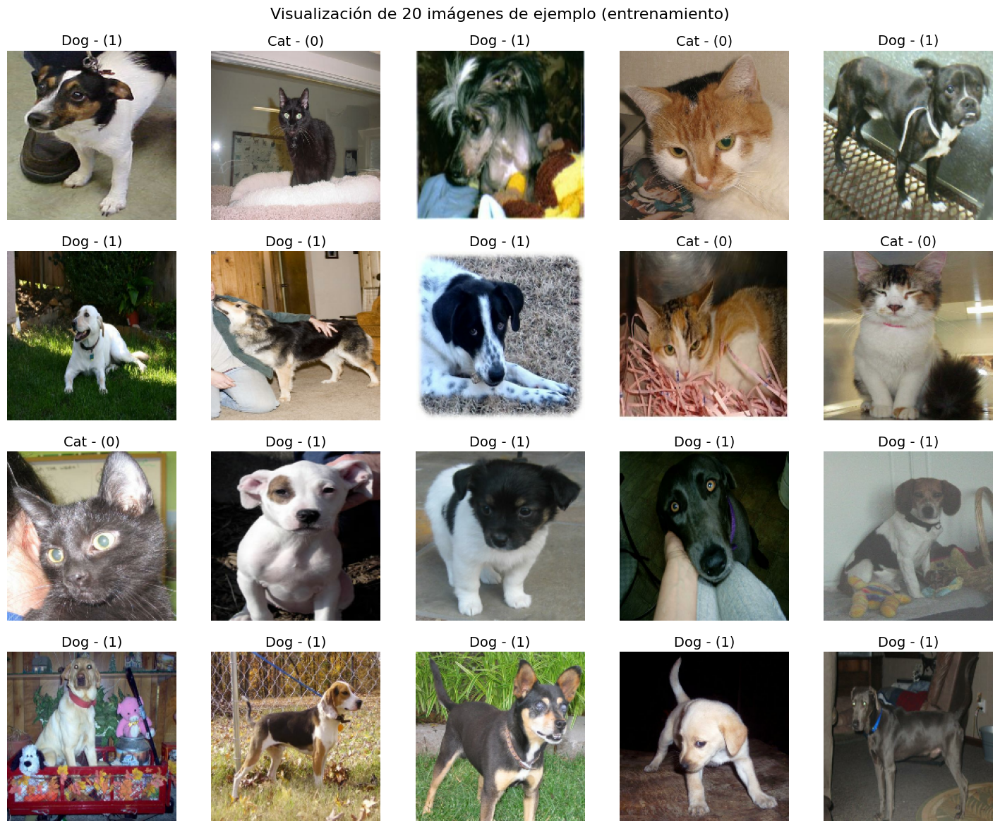

In [14]:
mostrar_imagenes_RBG(train_ds, class_names, num_imagenes=20, nombre_guardar= 'Visualizacion_ejemplo_entrenamiento' ,
                     titulo='(entrenamiento)')  # Muestra 12 imágenes, 5 columnas

Visualizamos $20$ imágenes del conjunto de validación.

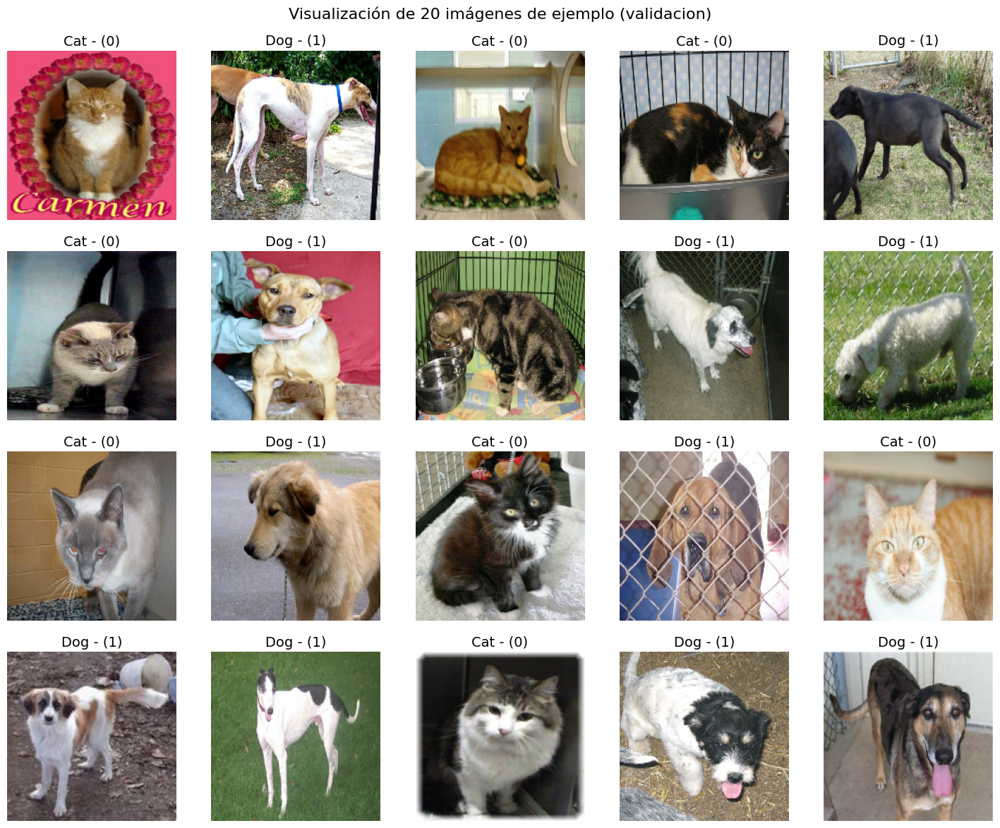

In [15]:
mostrar_imagenes_RBG(val_ds, class_names, num_imagenes=20, nombre_guardar= 'Visualizacion_ejemplo_validacion' ,
                     titulo='(validacion)')  # Muestra 12 imágenes, 5 columnas

Revisamos el **balanceo** de las clases en cada conjunto

In [16]:
resumen_dataset_imagekeras(train_ds, "Conjunto de entrenamiento")
resumen_dataset_imagekeras(val_ds, "Conjunto de validación")


        Conjunto de entrenamiento        
Total imágenes: 18728

Clase          Cantidad  Proporción
-----------------------------------
Cat            9420      0.503
Dog            9308      0.497

        Conjunto de validación        
Total imágenes: 4682

Clase          Cantidad  Proporción
-----------------------------------
Cat            2321      0.496
Dog            2361      0.504


## Escala a grises

Observamos actualmente que las imágenes están a color

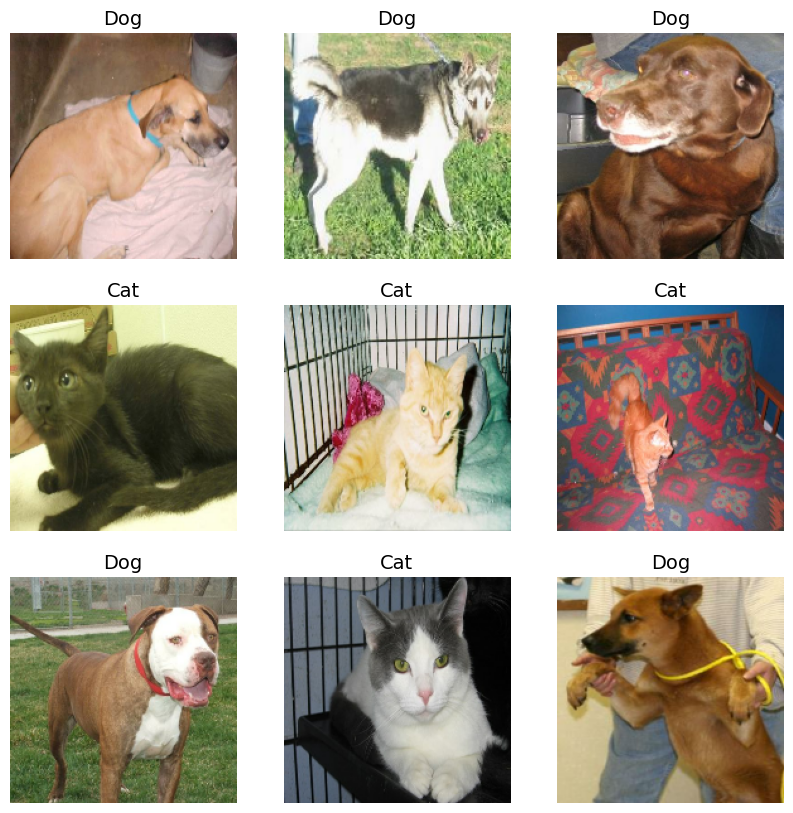

In [17]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(np.array(images[i]).astype("uint8"))
        plt.title(class_names[int(labels[i])])
        plt.axis("off")

Convertimos nuestras imágenes RGB a escala de grises y las normalizamos para que sus valores de píxel estén entre 0 y 1.

In [18]:
train_ds_gray_norm = train_ds.map(preprocess_RGB_a_grayscale_y_norm)
val_ds_gray_norm = val_ds.map(preprocess_RGB_a_grayscale_y_norm)

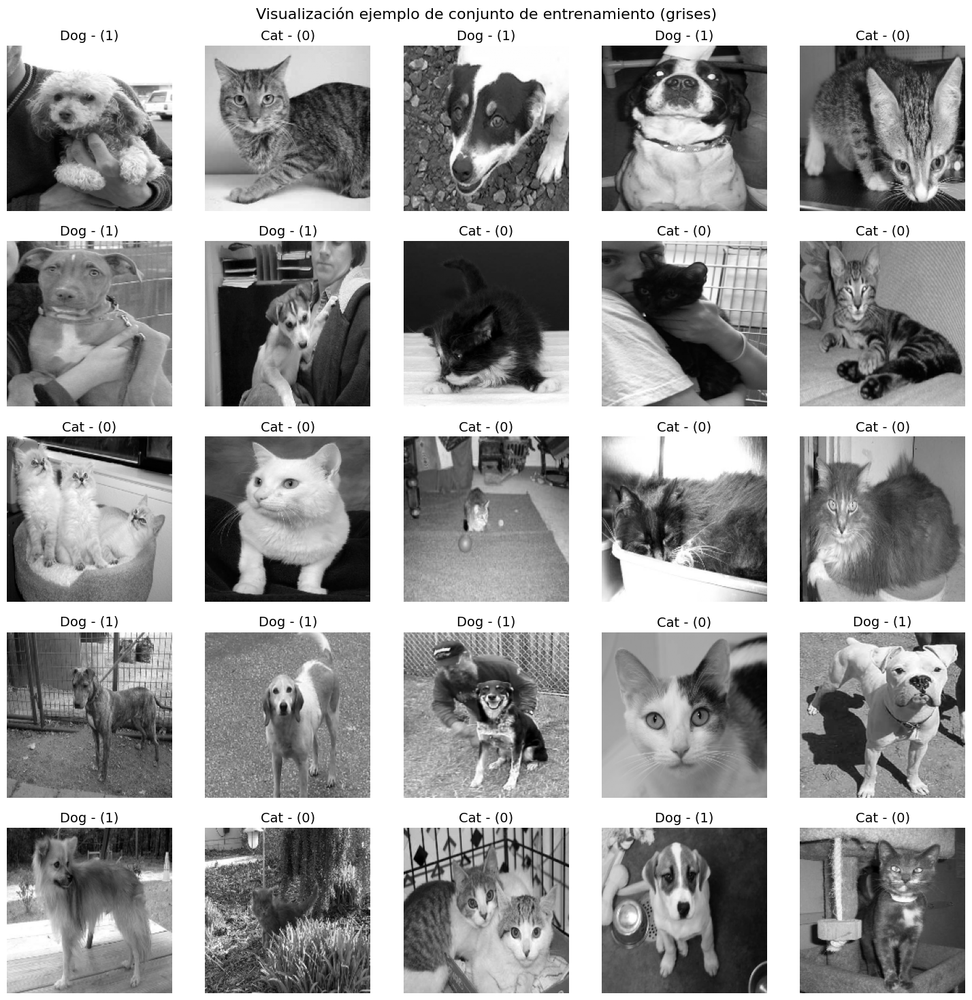

In [19]:
mostrar_imagenes_gris(train_ds_gray_norm, class_names,nombre_guardar= 'Visualización_Entrenamiento_EscalaGrises_modelo1',
                      titulo="Visualización ejemplo de conjunto de entrenamiento (grises)", num_imagenes=25, columnas=5)

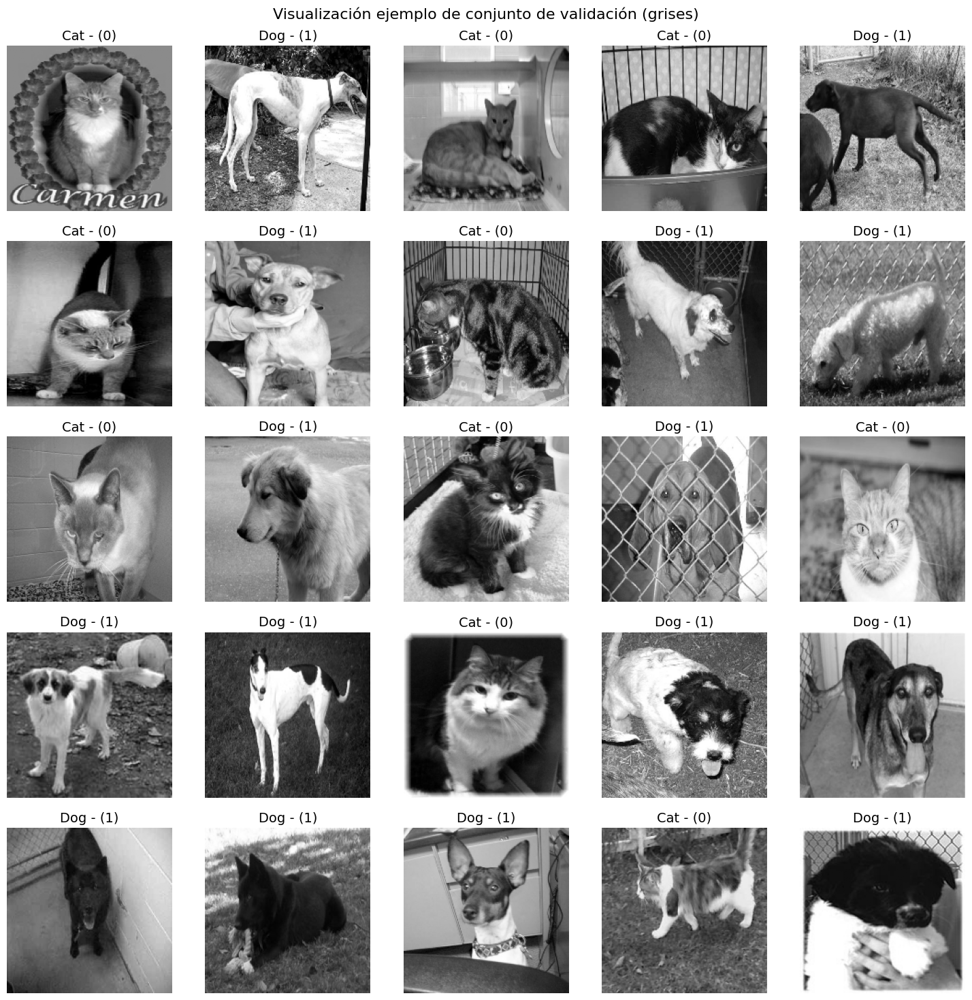

In [20]:
mostrar_imagenes_gris(val_ds_gray_norm, class_names,nombre_guardar= 'Visualización_Validacion_EscalaGrises_modelo1',
                      titulo="Visualización ejemplo de conjunto de validación (grises)", num_imagenes=25, columnas=5)

## Data augmentation

Lista de capas de aumento de datos

In [21]:
data_augmentation_layers = [
    layers.RandomFlip("horizontal"),  # Voltea la imagen horizontalmente de forma aleatoria
    layers.RandomRotation(0.1),       # Rota la imagen aleatoriamente hasta ±10% (~36 grados)
]

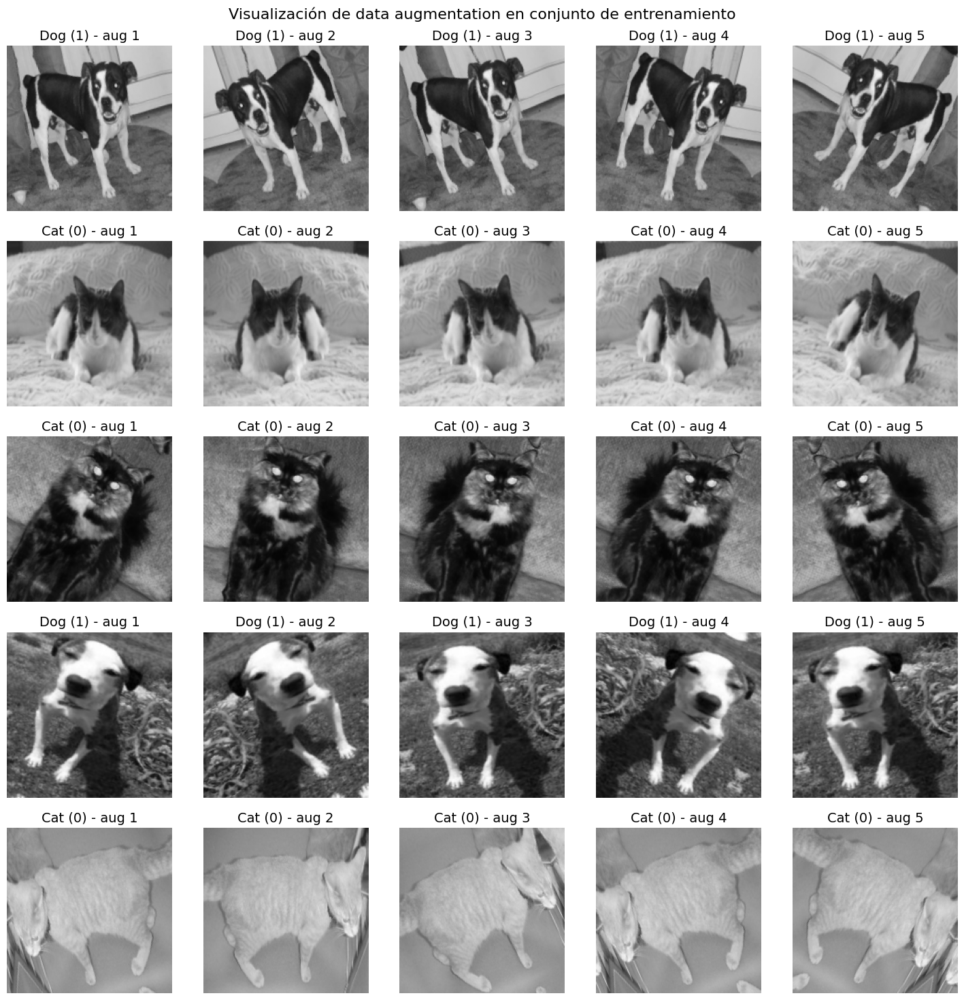

In [22]:
mostrar_imagenes_aumentadas_gris(
    train_ds_gray_norm,  # dataset de entrenamiento en escala de grises y normalizado
    class_names,         # lista con los nombres de las clases correspondientes a las etiquetas
    data_augmentation,   # función o pipeline que aplica aumentaciones a las imágenes
    num_imagenes=5,      # mostrar 5 imágenes originales del dataset
    num_aumentos=5,      # generar y mostrar 5 versiones aumentadas por cada imagen original
    columnas=5,          # organizar el grid con 5 columnas por fila
    titulo="Visualización de data augmentation en conjunto de entrenamiento",  # título general de la figura
    nombre_guardar="Visualizacion_de_data_augmentation_en_conjunto_de_entrenamiento_modelo1"  # guardar la figura con este nombre
)

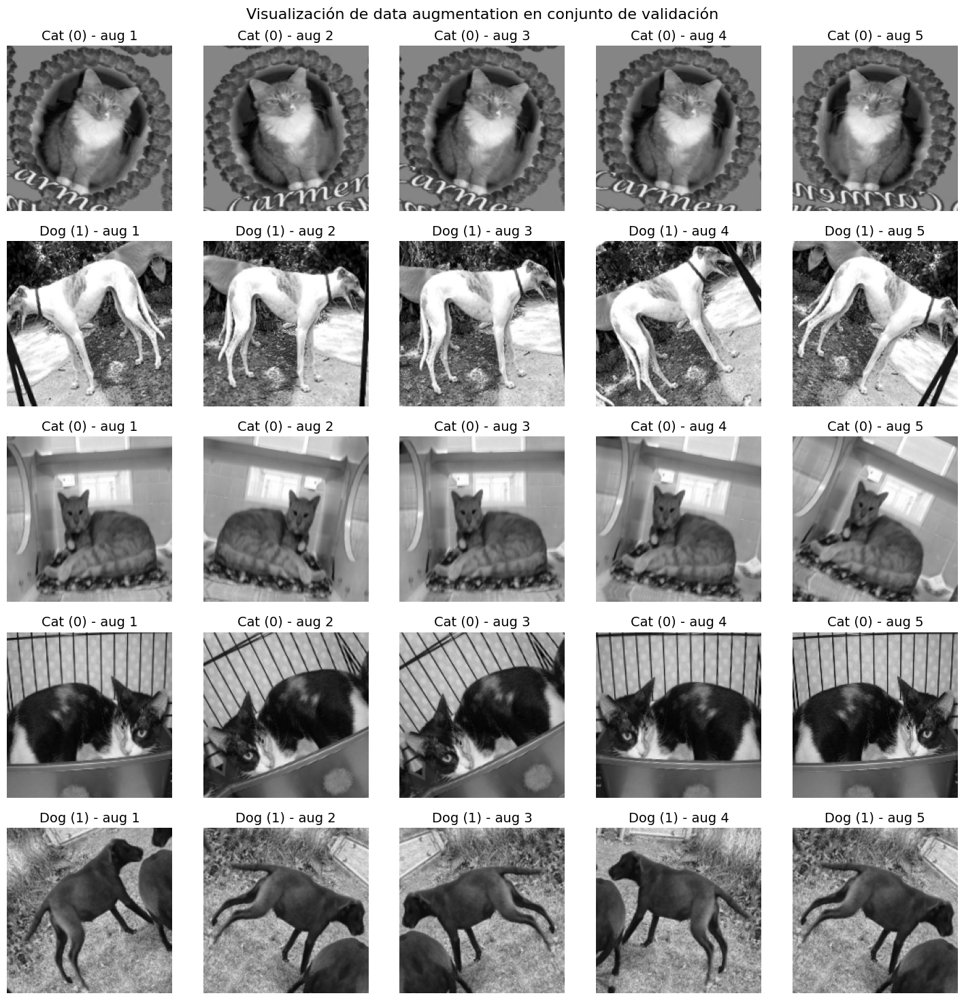

In [23]:
mostrar_imagenes_aumentadas_gris(
    val_ds_gray_norm,  # dataset de entrenamiento en escala de grises y normalizado
    class_names,         # lista con los nombres de las clases correspondientes a las etiquetas
    data_augmentation,   # función o pipeline que aplica aumentaciones a las imágenes
    num_imagenes=5,      # mostrar 5 imágenes originales del dataset
    num_aumentos=5,      # generar y mostrar 5 versiones aumentadas por cada imagen original
    columnas=5,          # organizar el grid con 5 columnas por fila
    titulo="Visualización de data augmentation en conjunto de validación",  # título general de la figura
    nombre_guardar="Visualizacion_de_data_augmentation_en_conjunto_de_validacion_modelo1"  # guardar la figura con este nombre
)

Aplicados <code> data_augmentation </code> a las imágenes de entrenamiento.

<code> train_ds.map() </code> transforma cada elemento del dataset usando la función lambda.

La función lambda recibe `img` y `label` y devuelve la imagen aumentada junto con su etiqueta original.


**NO cambia la cantidad de imágenes en tu dataset, solo modifica cada imagen “en el vuelo” (on-the-fly) durante el entrenamiento.**

Cada vez que el modelo “ve” una imagen durante el entrenamiento, podría ser ligeramente distinta gracias a la  <code> augmentación </code>

- Esto se llama **data augmentation en tiempo de entrenamiento.**
- Es diferente de duplicar imágenes: si quisieras aumentar el dataset de manera física (más imágenes reales), necesitarías crear nuevas imágenes y agregarlas explícitamente.

**Nota:** <code> lambda </code> es demasiado lento

In [24]:
train_ds_gray_norm = train_ds_gray_norm.map(
    lambda img, label: (data_augmentation(img), label),
    num_parallel_calls=tf_data.AUTOTUNE,  # Procesa múltiples elementos en paralelo para mayor eficiencia.
)


In [25]:
# `prefetch` permite preparar (cargar en memoria) los siguientes batches mientras la GPU está entrenando,
# lo que ayuda a maximizar la utilización de la GPU evitando que se quede esperando datos.
train_ds_gray_norm = train_ds_gray_norm.prefetch(tf_data.AUTOTUNE)
val_ds_gray_norm = val_ds_gray_norm.prefetch(tf_data.AUTOTUNE)  # Hacemos lo mismo para el dataset de validación.

## Modelo

### Manera manual

Reinicia los contadores internos de nombres en Keras. Esto evita cinflictos o nombres duplicados de capas/modelos

In [26]:
keras.backend.clear_session()

En este caso, se añadieron 2 tipos de capas convolucionales para tener un mejorar acurracy 

In [27]:

model = keras.Sequential([
    # Entrada
    keras.Input(shape=(180, 180, 1)),

    # Primera capa convolucional
    layers.Conv2D(32, kernel_size=(3,3), activation="relu", padding="same"),
    layers.MaxPooling2D(pool_size=(2,2)),

    # Segunda capa convolucional
    layers.Conv2D(64, kernel_size=(3,3), activation="relu", padding="same"),
    layers.MaxPooling2D(pool_size=(2,2)),

    # Tercera capa convolucional
    layers.Conv2D(128, kernel_size=(3,3), activation="relu", padding="same"),
    layers.MaxPooling2D(pool_size=(2,2)),

    # Cuarta capa convolucional
    layers.Conv2D(256, kernel_size=(3,3), activation="relu", padding="same"),
    layers.MaxPooling2D(pool_size=(2,2)),

    # Flatten
    layers.Flatten(),

    # Capas densas
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(128, activation="relu"),
    layers.Dropout(0.5),

    # Capa de salida
    layers.Dense(num_classes, activation="softmax")
])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 180, 180, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 90, 90, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 90, 90, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 45, 45, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 45, 45, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 22, 22, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 22, 22, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 11, 11, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     7,930,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,351,106 (31.86 MB)

 Trainable params: 8,351,106 (31.86 MB)

 Non-trainable params: 0 (0.00 B)

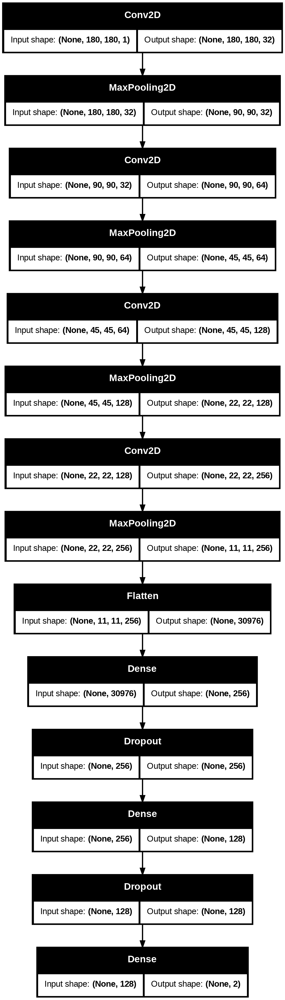

In [28]:
# Visualización del modelo con shapes de cada capa
keras.utils.plot_model(model, show_shapes=True)

In [29]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 180, 180, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 90, 90, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 90, 90, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 45, 45, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 45, 45, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 22, 22, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 22, 22, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 11, 11, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     7,930,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,351,106 (31.86 MB)

 Trainable params: 8,351,106 (31.86 MB)

 Non-trainable params: 0 (0.00 B)

**Número de épocas:** Definimos cuántas veces pasará el modelo por todo el dataset de entrenamiento

In [30]:
epochs = 25
epochs

25

**Callbacks:** <code> ModelCheckpoint </code> guarda el modelo en cada época con el nombre especificado

In [31]:
callbacks = [
    keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]
callbacks

**Compilación del modelo**

In [32]:
model.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

**Entrenamiento:** En este caso, el modelo es muy grande, lo que hace que no corra en local

In [33]:
history = model.fit(
    train_ds_gray_norm,           # Dataset de entrenamiento
    epochs=epochs,      # Número de épocas definido arriba
    callbacks=callbacks,  # Callbacks definidos (guardar modelo por época)
    validation_data=val_ds_gray_norm,  # Dataset de validación para monitorear desempeño
)

Epoch 1/25
147/147 ━━━━━━━━━━━━━━━━━━━━ 78s 419ms/step - accuracy: 0.5520 - loss: 0.6818 - val_accuracy: 0.6581 - val_loss: 0.6325
Epoch 2/25
147/147 ━━━━━━━━━━━━━━━━━━━━ 52s 350ms/step - accuracy: 0.6791 - loss: 0.6068 - val_accuracy: 0.7117 - val_loss: 0.5516
Epoch 3/25
147/147 ━━━━━━━━━━━━━━━━━━━━ 86s 379ms/step - accuracy: 0.7364 - loss: 0.5356 - val_accuracy: 0.7708 - val_loss: 0.4802
Epoch 4/25
147/147 ━━━━━━━━━━━━━━━━━━━━ 52s 350ms/step - accuracy: 0.7715 - loss: 0.4828 - val_accuracy: 0.8101 - val_loss: 0.4232
Epoch 5/25
147/147 ━━━━━━━━━━━━━━━━━━━━ 82s 349ms/step - accuracy: 0.7966 - loss: 0.4462 - val_accuracy: 0.8195 - val_loss: 0.4004
Epoch 6/25
147/147 ━━━━━━━━━━━━━━━━━━━━ 82s 351ms/step - accuracy: 0.8108 - loss: 0.4194 - val_accuracy: 0.8026 - val_loss: 0.4277
Epoch 7/25
147/147 ━━━━━━━━━━━━━━━━━━━━ 63s 426ms/step - accuracy: 0.8240 - loss: 0.3981 - val_accuracy: 0.8343 - val_loss: 0.3801
Epoch 8/25
147/147 ━━━━━━━━━━━━━━━━━━━━ 52s 352ms/step - accuracy: 0.8370 - loss: 0

In [34]:
history.params

{'verbose': 'auto', 'epochs': 25, 'steps': 147}

In [35]:
# history.epoch es una lista que contiene los índices de las épocas completadas
print(history.epoch) #Cada número representa una época completa, es decir, una pasada completa por todo el conjunto de entrenamiento

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]


*  La pérdida (loss) de entrenamiento disminuyó lo cual es buena señal.
*  El acurracy de entrenamiento es ligeramente menor que el de validación disminuyo.

In [36]:
# Convertimos el historial en DataFrame
df = pd.DataFrame(history.history)
df

,accuracy,loss,val_accuracy,val_loss
0,0.552008,0.681820,0.658052,0.632513
1,0.679090,0.606781,0.711662,0.551594
2,0.736437,0.535650,0.770824,0.480160
3,0.771519,0.482765,0.810124,0.423244
4,0.796561,0.446213,0.819522,0.400405
5,0.810818,0.419354,0.802648,0.427733
6,0.824007,0.398122,0.834259,0.380114
7,0.837035,0.371158,0.851986,0.335569
8,0.848622,0.348495,0.872063,0.308650
9,0.856525,0.330036,0.848996,0.331823


In [37]:
len(df) # Número de épocas

25

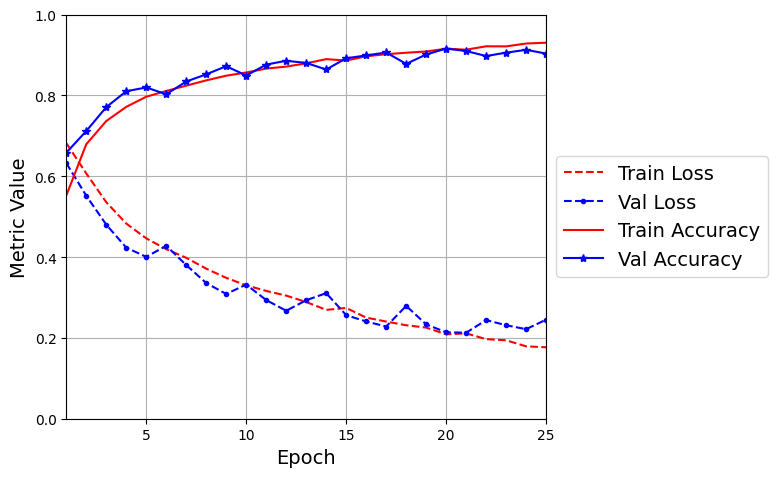

In [38]:
plot_learning_curves_clasificacion(history, "CatDog_Model_learning_curves.png")